# Preparation

In [1]:
from __future__ import print_function
from os import listdir
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
%matplotlib inline

## Read Data

In [2]:
class unitStructure():
    def __init__(self):
        self.Spikes = []
        self.IS = 0.0
        self.XYZ = []
        self.Loc = ''
        self.Stab = []

In [60]:
def kernel_smoothing(spikeTrain, sigma):
    approxFiringRate = np.zeros(len(spikeTrain))
    timeSeries = np.arange(len(spikeTrain))
    for timePoint in timeSeries:
        kernel = np.exp(-(timeSeries - timePoint) ** 2 / (2 * sigma ** 2))
        kernel = kernel / sum(kernel) # 正規化
        approxFiringRate[timePoint] = sum(spikeTrain * kernel)
    return approxFiringRate

In [4]:
dataDir = '../data/'
dirNames = ['m4404ee', 'c6404ee']

## Spikes
### Creating DataFrames of experimental schemes(m4404ee, c6404ee)

In [18]:
unitDict_m4404ee = {}
unitDict_c6404ee = {}
for dirName in dirNames:
    targetDir = dataDir + dirName
    files = listdir(targetDir)
    for fileName in files:
        if fileName.startswith('unit') & fileName.endswith('.binaryfile'):
            fh = open(targetDir + '/' + fileName, 'rb')
            unit = pickle.load(fh)
            if dirName == 'm4404ee':
                unitDict_m4404ee[dirName + '/' + fileName.replace('.binaryfile', '')] = unit.Spikes
            elif dirName == 'c6404ee':
                unitDict_c6404ee[dirName + '/' + fileName.replace('.binaryfile', '')] = unit.Spikes

In [ ]:
SpikesDataFrame_m4404ee = pd.DataFrame(unitDict_m4404ee)

In [36]:
SpikesDataFrame_m4404ee

,m4404ee/unit101,m4404ee/unit102,m4404ee/unit103,m4404ee/unit104,m4404ee/unit105,m4404ee/unit201,m4404ee/unit202,m4404ee/unit301,m4404ee/unit302,m4404ee/unit401,m4404ee/unit402
0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
5,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, ..."
6,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0,

In [38]:
Spikes_m4404ee = SpikesDataFrame_m4404ee.values

In [ ]:
del unitDict_c6404ee['c6404ee/unit402'] # remove noise dataset

In [ ]:
SpikesDataFrame_c6404ee = pd.DataFrame(unitDict_c6404ee)

In [23]:
SpikesDataFrame_c6404ee

,c6404ee/unit101,c6404ee/unit102,c6404ee/unit103,c6404ee/unit104,c6404ee/unit105,c6404ee/unit106,c6404ee/unit107,c6404ee/unit108,c6404ee/unit201,c6404ee/unit301,c6404ee/unit302,c6404ee/unit303,c6404ee/unit304,c6404ee/unit401,c6404ee/unit405
0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[nan

In [37]:
Spikes_c6404ee = SpikesDataFrame_c6404ee.values

## Tbhv, trTarget, ANDat, analogAx
### Creating Lists of experimental scheme(m4404ee, c6404ee)

In [315]:
TbhvDataFrame_m4404ee = pd.read_csv('../data/m4404ee/Tbhv.txt', header=None, sep=', ')
trTargetsDataFrame_m4404ee = pd.read_csv('../data/m4404ee/trTarget.txt', header=None)
ANDatDataFrame_m4404ee = pd.read_csv('../data/m4404ee/ANDat.txt', header=None, sep=', ')
analogAxDataFrame_m4404ee = pd.read_csv('../data/m4404ee/analogAx.txt', header=None)

/Users/motofumishishikura/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/ipykernel/__main__.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  if __name__ == '__main__':
/Users/motofumishishikura/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/ipykernel/__main__.py:3: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  app.launch_new_instance()


In [316]:
Tbhv_m4404ee = TbhvDataFrame_m4404ee.values
trTargets_m4404ee = trTargetsDataFrame_m4404ee.values
trTargets_m4404ee = trTargets_m4404ee.ravel()
ANDat_m4404ee = ANDatDataFrame_m4404ee.values
analogAx_m4404ee = analogAxDataFrame_m4404ee.values
analogAx_m4404ee = analogAx_m4404ee.ravel()

In [318]:
TbhvDataFrame_c6404ee = pd.read_csv('../data/c6404ee/Tbhv.txt', header=None, sep=', ')
trTargetsDataFrame_c6404ee = pd.read_csv('../data/c6404ee/trTarget.txt', header=None)
ANDatDataFrame_c6404ee = pd.read_csv('../data/c6404ee/ANDat.txt', header=None, sep=', ')
analogAxDataFrame_c6404ee = pd.read_csv('../data/c6404ee/analogAx.txt', header=None)

/Users/motofumishishikura/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/ipykernel/__main__.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  if __name__ == '__main__':
/Users/motofumishishikura/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/ipykernel/__main__.py:3: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  app.launch_new_instance()


In [319]:
Tbhv_c6404ee = TbhvDataFrame_c6404ee.values
trTargets_c6404ee = trTargetsDataFrame_c6404ee.values
trTargets_c6404ee = trTargets_c6404ee.ravel()
ANDat_c6404ee = ANDatDataFrame_c6404ee.values
analogAx_c6404ee = analogAxDataFrame_c6404ee.values
analogAx_c6404ee =  analogAx_c6404ee.ravel()

# Data Visualization  [m4404ee]

## Plot firing rate(average over unit)

In [85]:
trTargetsDataFrame_m4404ee[0].value_counts()

3    35
7    34
2    32
6    29
5    29
8    28
4    28
1    26
Name: 0, dtype: int64

In [351]:
AverageSpikesOverUnit = np.sum(Spikes_m4404ee, axis=1) / Spikes_m4404ee.shape[1]
AverageSpikesOverUnit

array([array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.        ,  0.        ,  0.        , ...,  0.        ,
        0.        ,  0.09090909]),
       array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.        ,  0.        ,  0.09090909, ...,  0.        ,
        0.        ,  0.        ]),
       array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.        ,  0.        ,  0.        , ...,  0.09090909,
        0.        ,  0.        ]),
       array([ 0.,  0.,  0., ...,  0.,  0.,  0.]),
       array([ 0.        ,  0.        ,  0.09090909, ...,  0.        ,
        0.        ,  0.        ]),
       array([ 

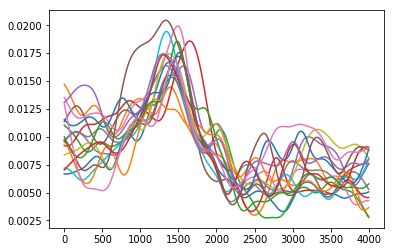

In [88]:
trTargetNum = 1
for i, trTarget in enumerate(trTargets_m4404ee):
    if trTarget == trTargetNum:
        plt.plot(kernel_smoothing(AverageSpikesOverUnit[i], 100))

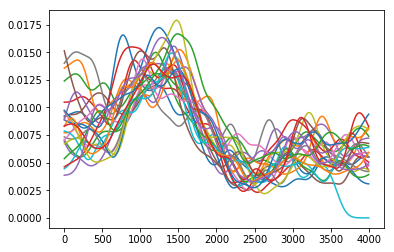

In [68]:
trTargetNum = 2
for i, trTarget in enumerate(trTargets_m4404ee):
    if trTarget == trTargetNum:
        plt.plot(kernel_smoothing(AverageSpikesOverUnit[i], 100))

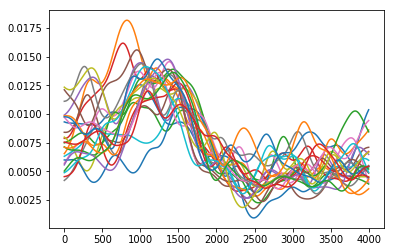

In [70]:
trTargetNum = 3
for i, trTarget in enumerate(trTargets_m4404ee):
    if trTarget == trTargetNum:
        plt.plot(kernel_smoothing(AverageSpikesOverUnit[i], 100))

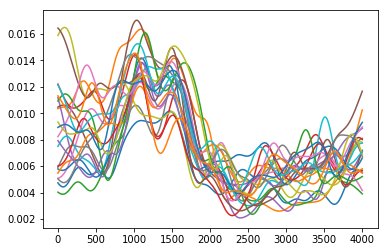

In [71]:
trTargetNum = 4
for i, trTarget in enumerate(trTargets_m4404ee):
    if trTarget == trTargetNum:
        plt.plot(kernel_smoothing(AverageSpikesOverUnit[i], 100))

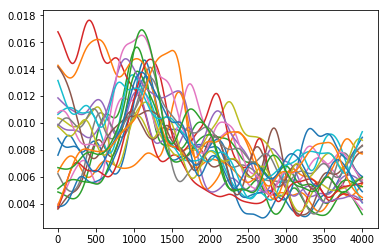

In [72]:
trTargetNum = 5
for i, trTarget in enumerate(trTargets_m4404ee):
    if trTarget == trTargetNum:
        plt.plot(kernel_smoothing(AverageSpikesOverUnit[i], 100))

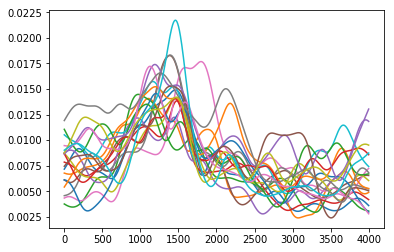

In [74]:
trTargetNum = 6
for i, trTarget in enumerate(trTargets_m4404ee):
    if trTarget == trTargetNum:
        plt.plot(kernel_smoothing(AverageSpikesOverUnit[i], 100))

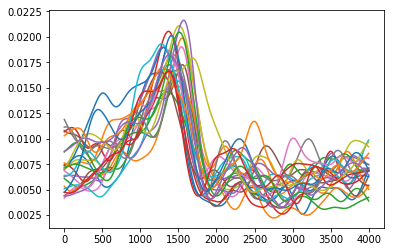

In [75]:
trTargetNum = 7
for i, trTarget in enumerate(trTargets_m4404ee):
    if trTarget == trTargetNum:
        plt.plot(kernel_smoothing(AverageSpikesOverUnit[i], 100))

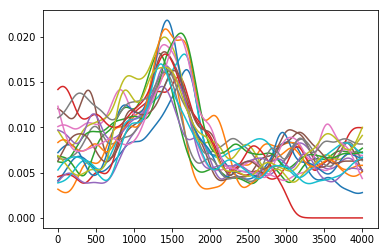

In [76]:
trTargetNum = 8
for i, trTarget in enumerate(trTargets_m4404ee):
    if trTarget == trTargetNum:
        plt.plot(kernel_smoothing(AverageSpikesOverUnit[i], 100))

## Approximating firing rate using Gaussian smoothing for overall trial

### unit101

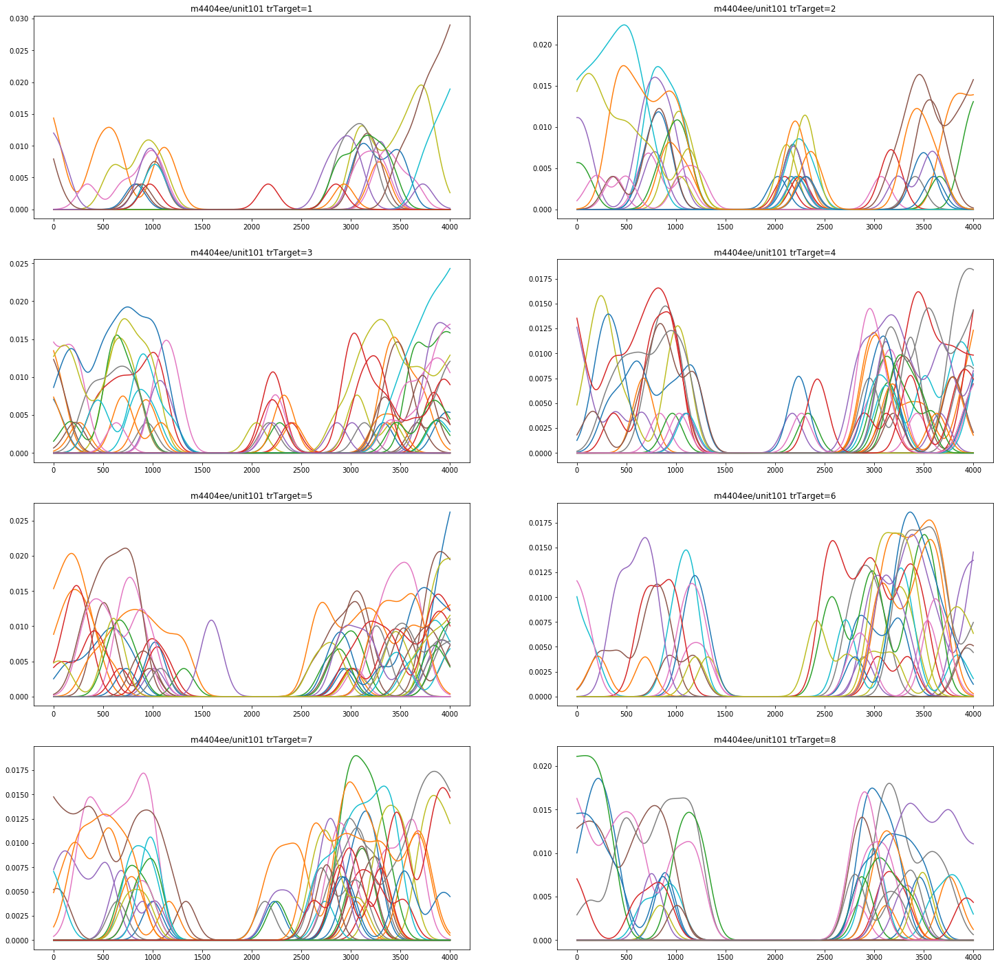

In [339]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,0][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

### unit102

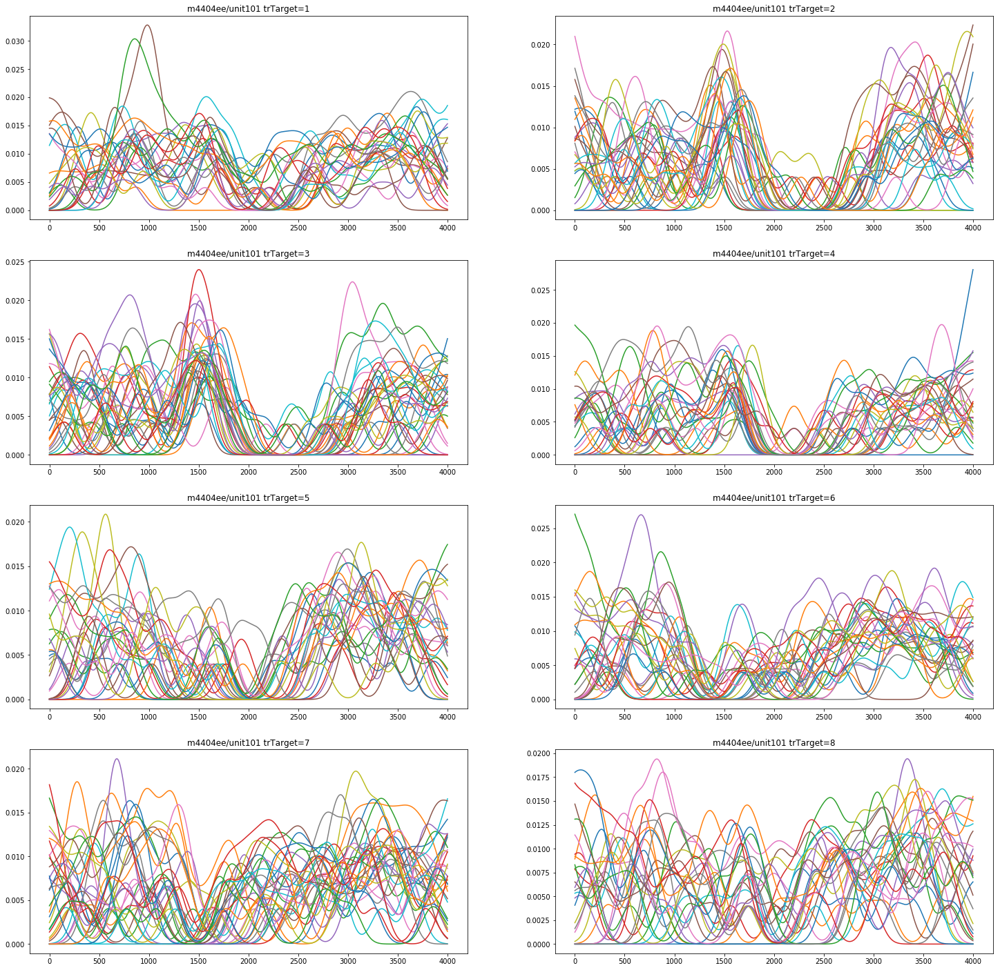

In [340]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,1][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

### unit103

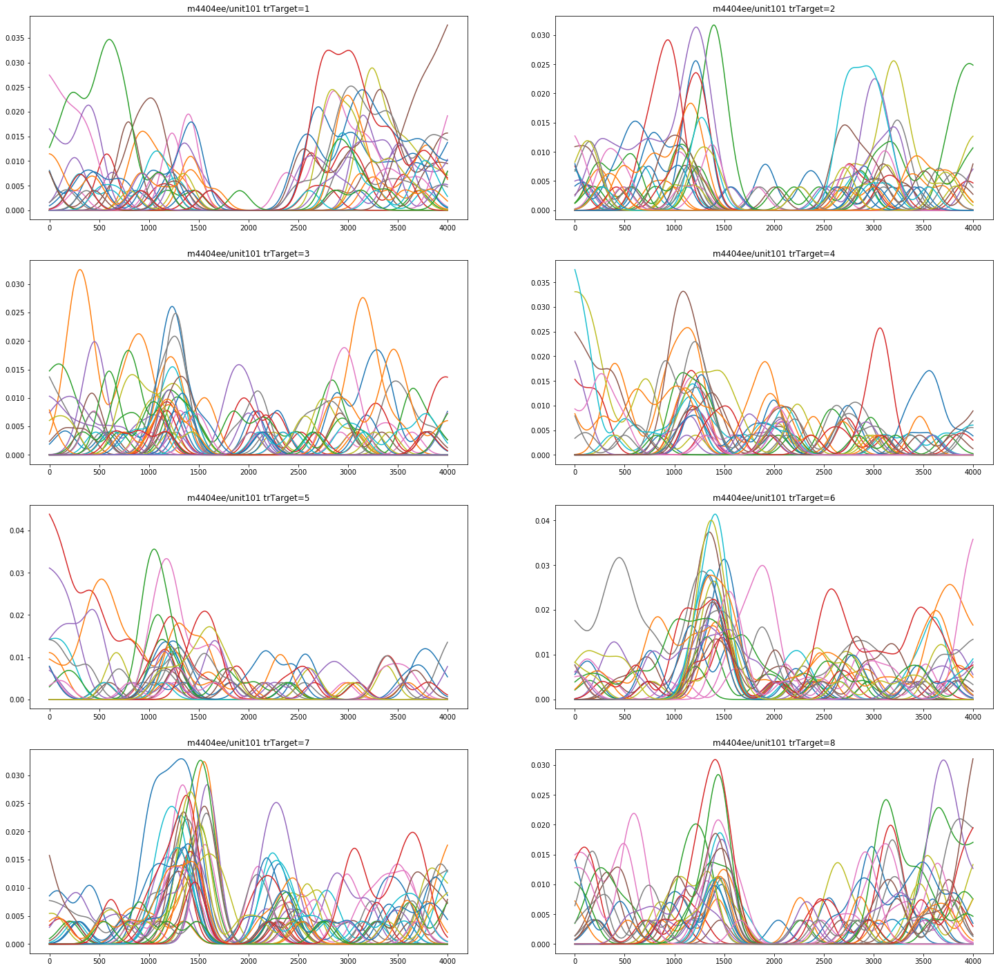

In [341]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,2][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

### unit104

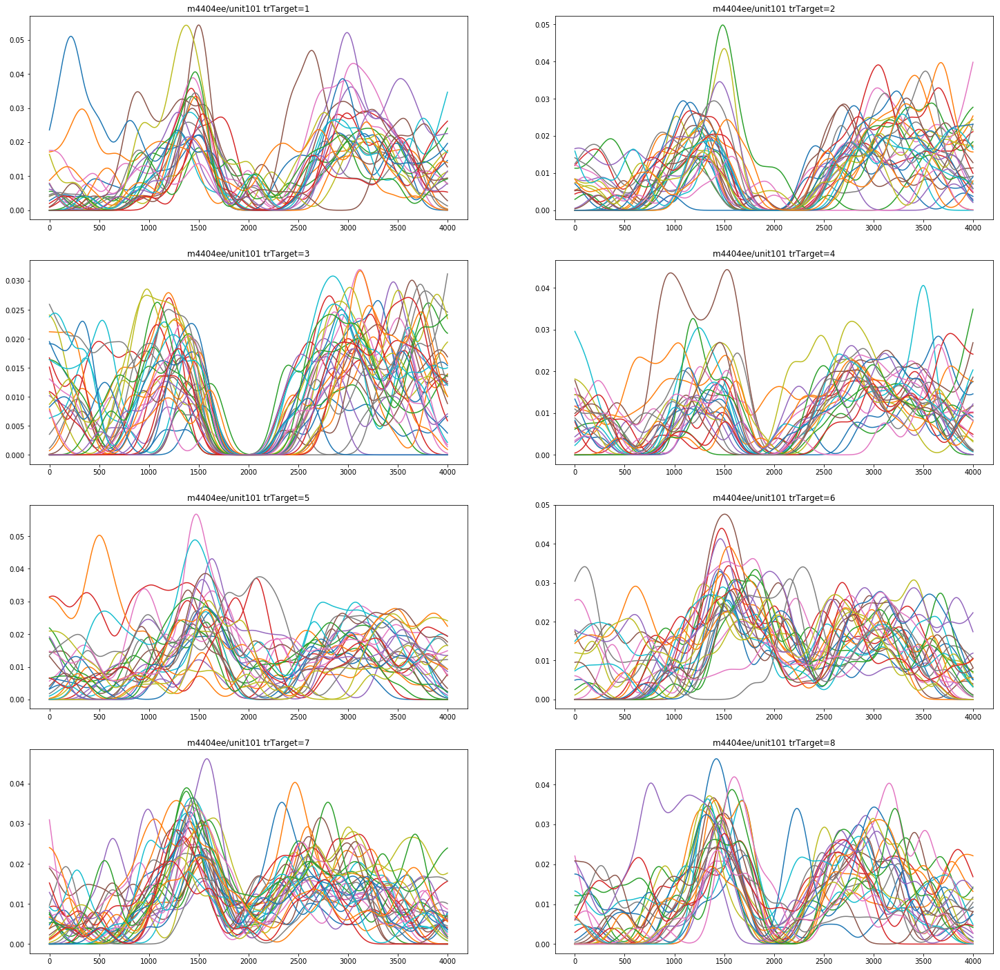

In [342]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,3][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

### unit105

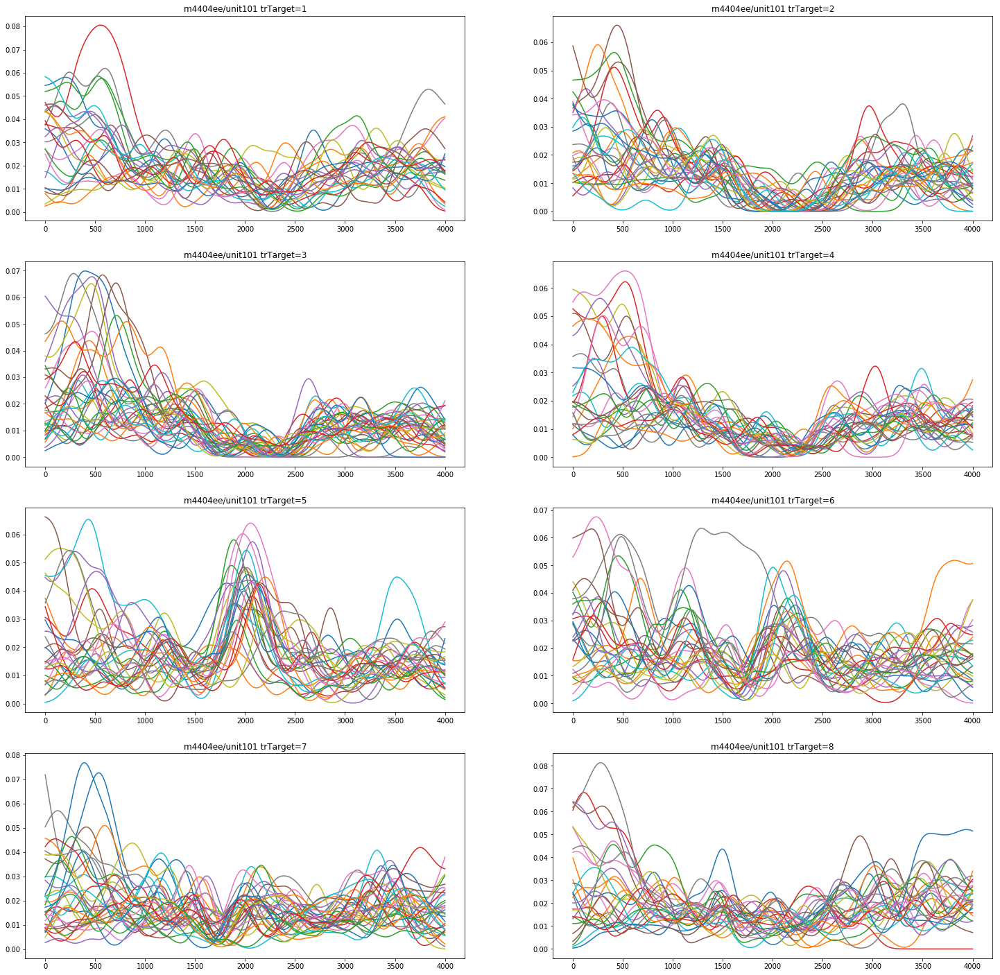

In [343]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,4][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

### unit201

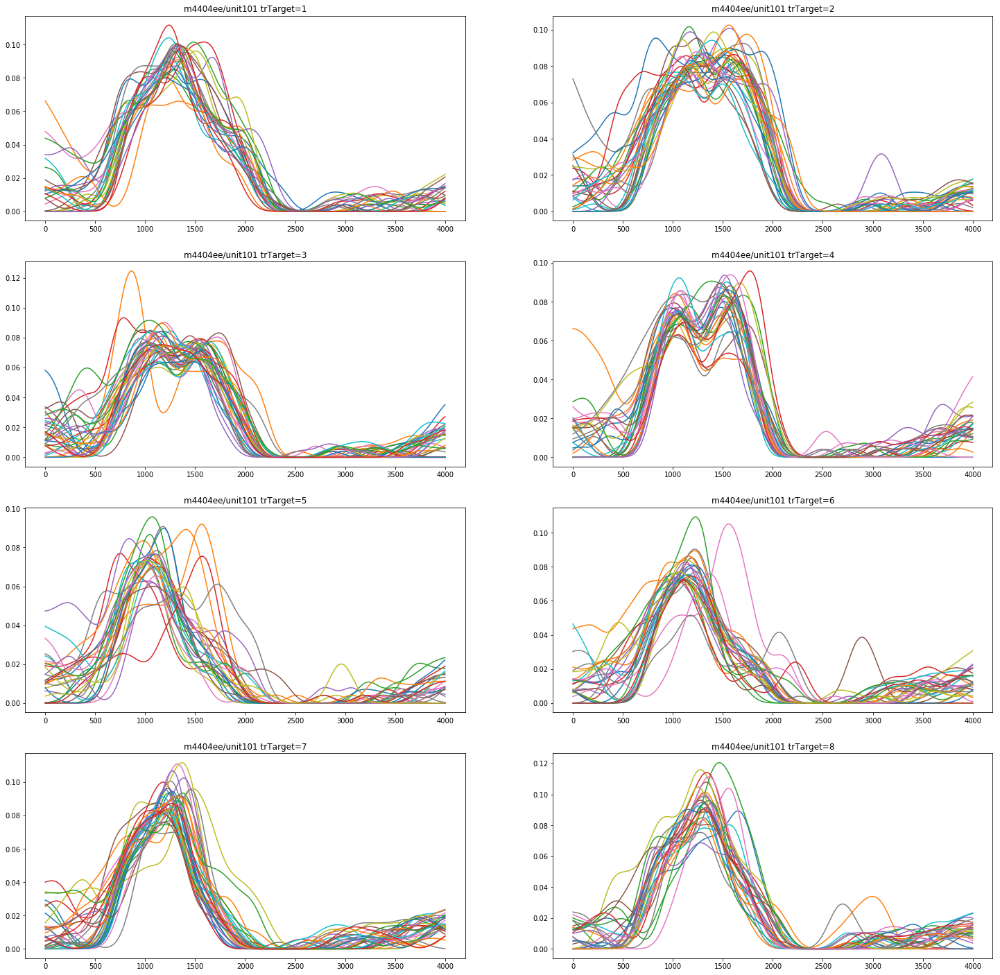

In [344]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,5][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

### unit202

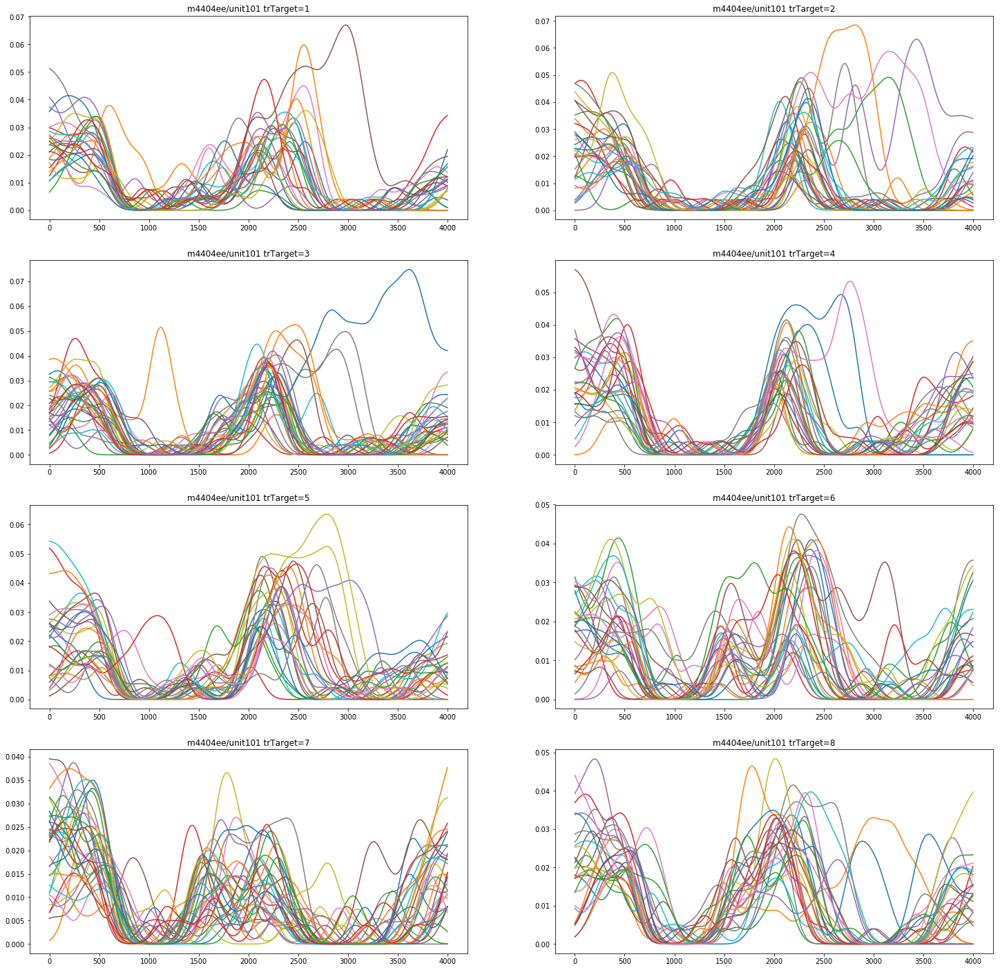

In [345]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,6][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

### unit301

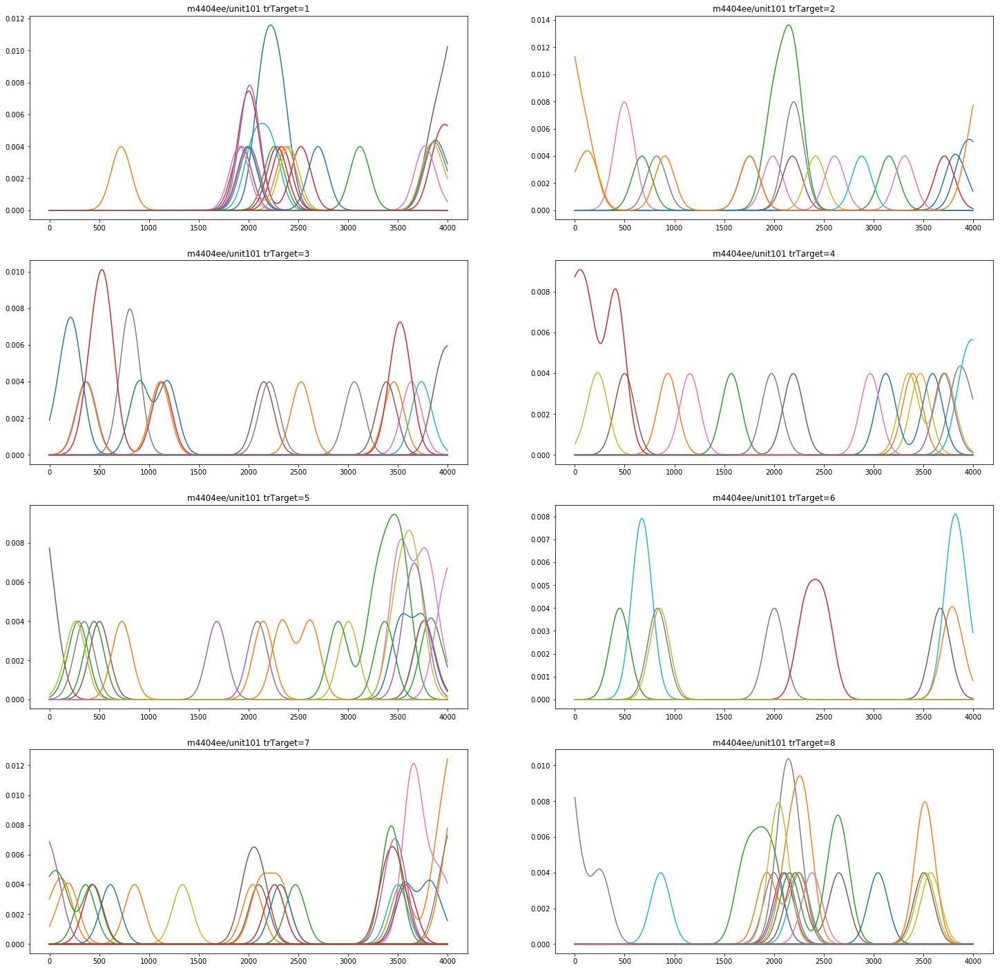

In [346]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,7][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

### unit302

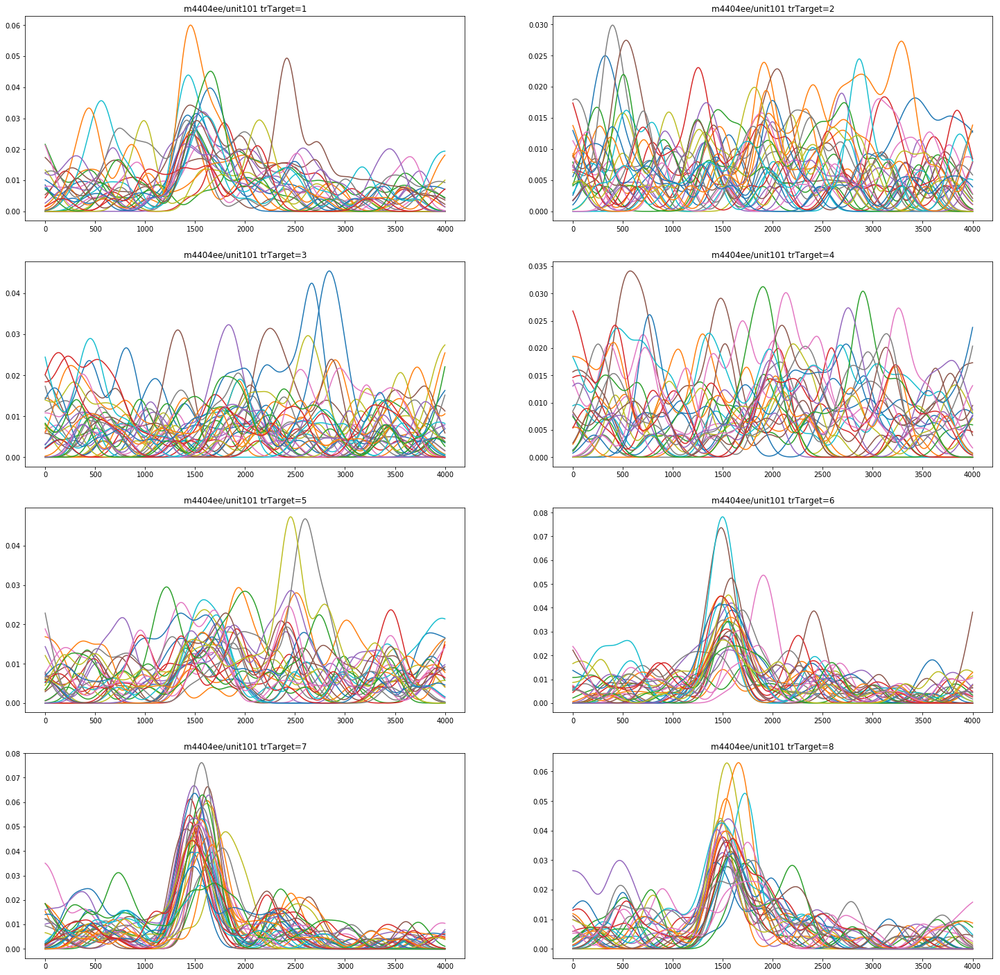

In [347]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,8][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

### unit401

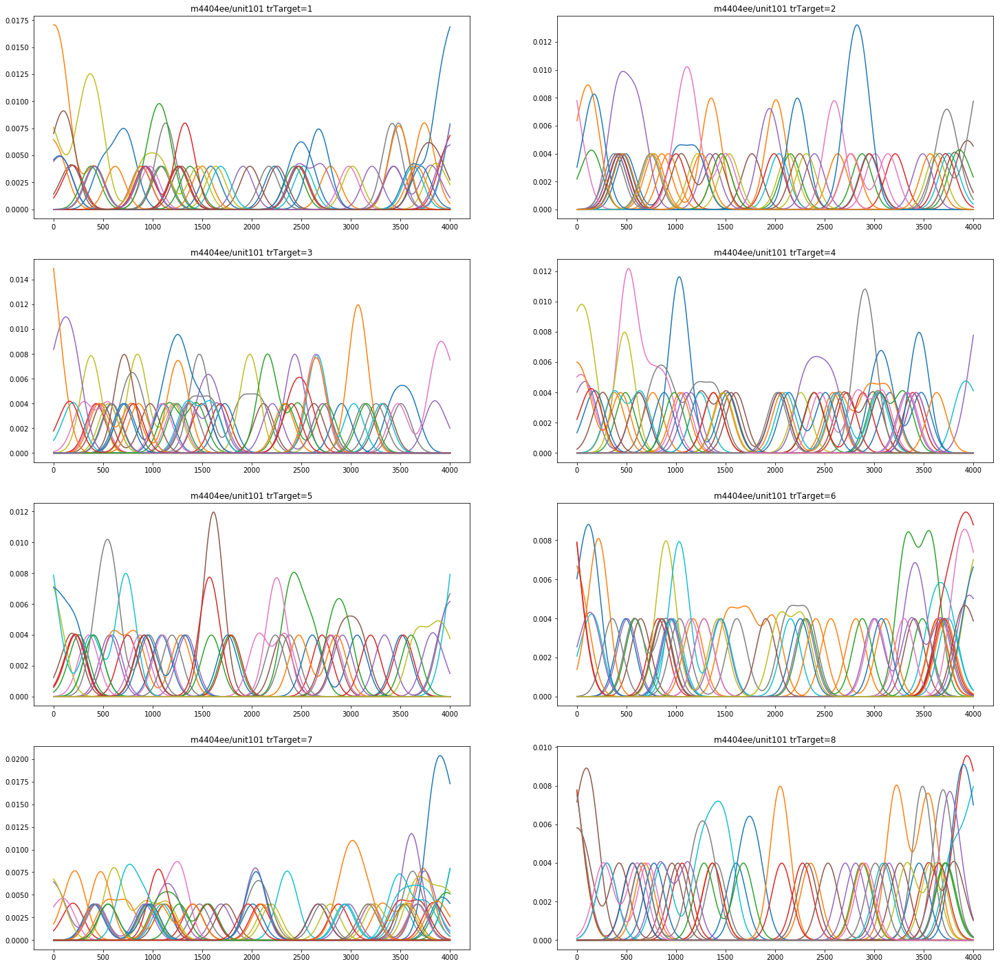

In [348]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,9][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

### unit402

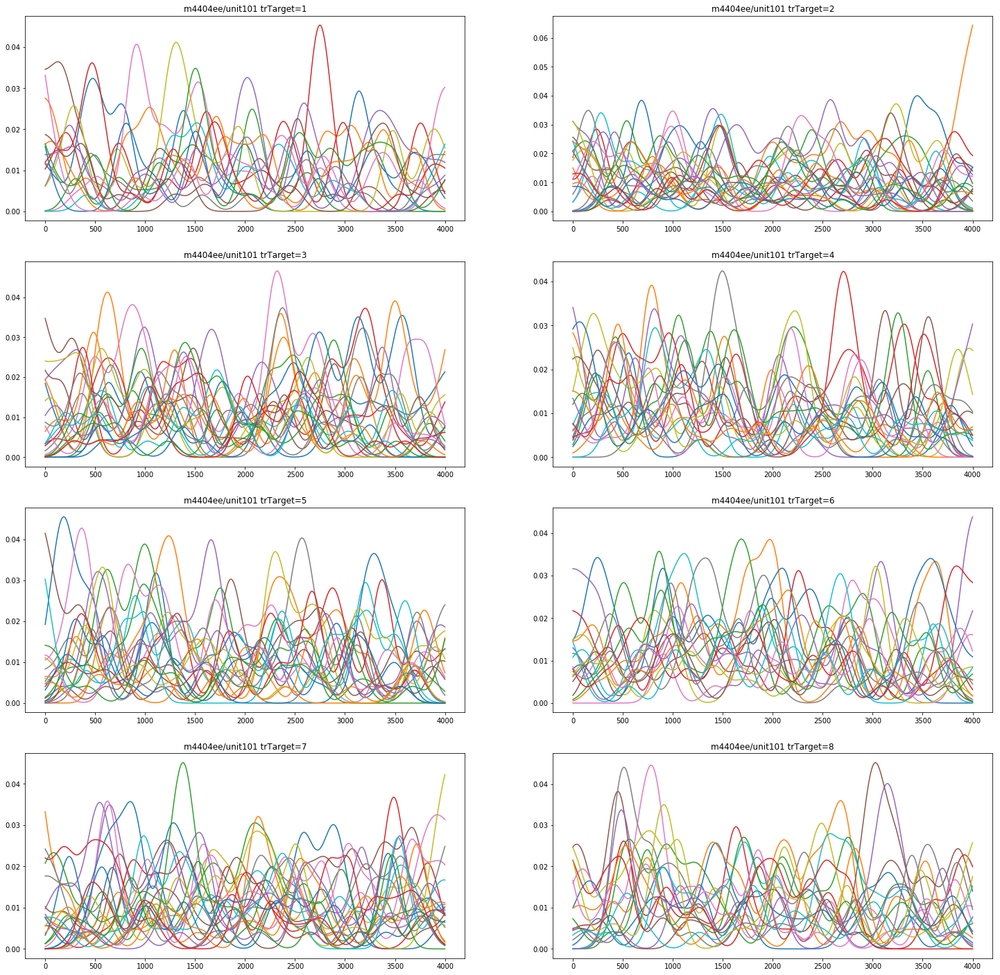

In [349]:
fig = plt.figure(figsize=(25,25))
axes = []

for trTargetNum in range(1,9):
    axes.append(fig.add_subplot(4,2,trTargetNum))
    for i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget == trTargetNum:
            axes[trTargetNum-1].plot(kernel_smoothing(Spikes_m4404ee[:,10][i], 100))
    axes[trTargetNum-1].set_title('m4404ee/unit101 trTarget=' + str(trTargetNum))
plt.show() 

## Tuning curve

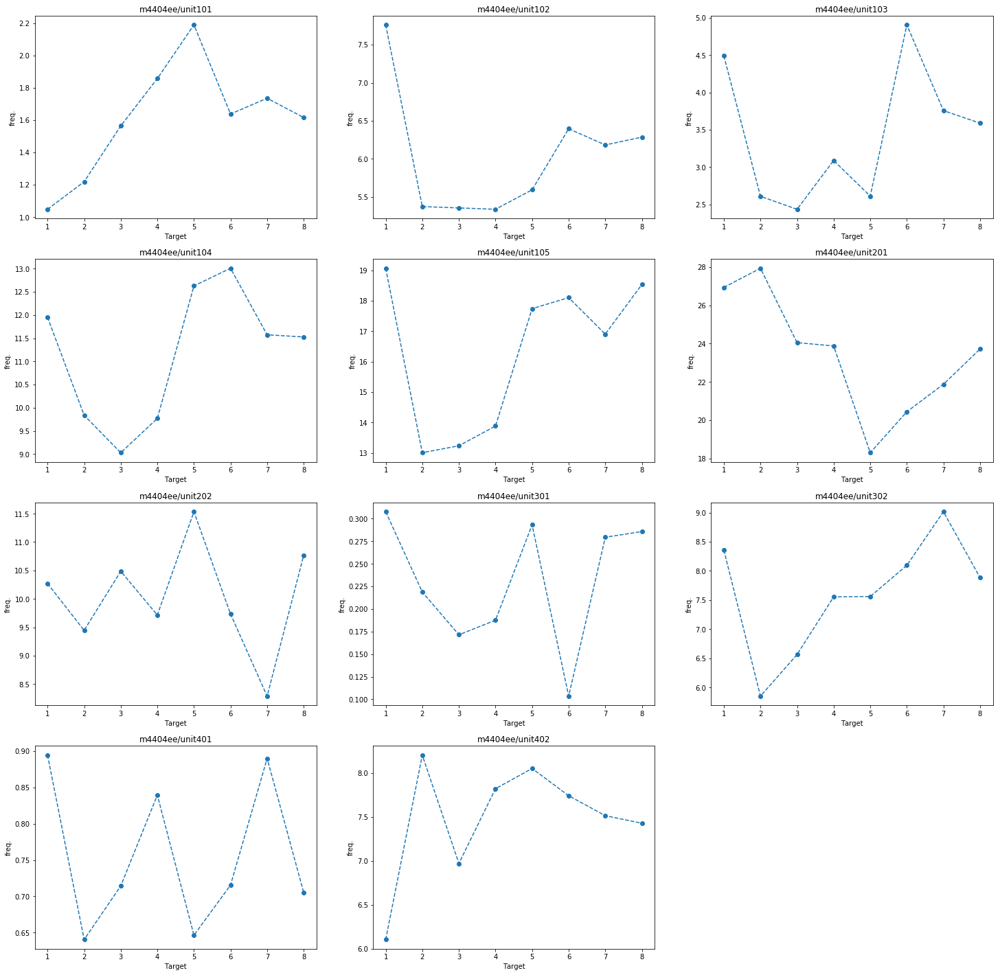

In [338]:
fig = plt.figure(figsize=(25,25))
axes = []
countUnit = 0
trialNumTrTarget = np.unique(trTargets_m4404ee, return_counts=True)

for unitName, Spikes in SpikesDataFrame_m4404ee.iteritems():
    TuningCurveDict = {}
    for trTarget_i, trTarget in enumerate(trTargets_m4404ee):
        if trTarget not in TuningCurveDict:
            TuningCurveDict[trTarget] = np.sum(Spikes[trTarget_i])
        else:
            if np.isnan(np.sum(Spikes[trTarget_i])):
                continue
            else:
                TuningCurveDict[trTarget] = TuningCurveDict[trTarget] + np.sum(Spikes[trTarget_i])

    for trTarget, numSpikes in TuningCurveDict.items():
        freq = numSpikes / 4 / trialNumTrTarget[1][trTarget-1] # calculate frequency
        TuningCurveDict[trTarget] = freq
    
    axes.append(fig.add_subplot(4,3,countUnit+1))
    axes[countUnit].plot(list(TuningCurveDict.keys()), list(TuningCurveDict.values()), '--o')
    axes[countUnit].set_title(unitName)
    axes[countUnit].set_xlabel('Target')
    axes[countUnit].set_ylabel('freq.')
    countUnit += 1
    
plt.show()

## Andat

In [ ]:
fig = plt.figure(figsize=(25,25))
axes = []
for trTarget in trTargets_m4404ee:
    if trTarget == 5:
        
axes.append(fig.add_subplot(4,3,countUnit+1))
axes[countUnit].plot(list(TuningCurveDict.keys()), list(TuningCurveDict.values()))
axes[countUnit].set_title(unitName)
axes[countUnit].set_xlabel('Target')
axes[countUnit].set_ylabel('freq.')
    
plt.show()

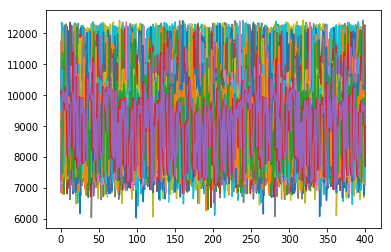

In [324]:
for i, trTarget in enumerate(trTargets_m4404ee):
    if trTarget == 3:
        plt.plot(ANDat_m4404ee[i])

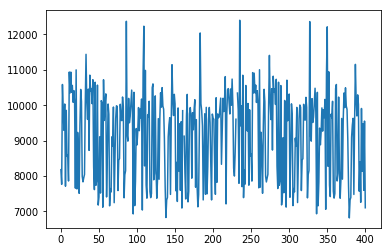

## Culculating Spiking Probability

In [12]:
file = open('../data/m4404ee/unit101.binaryfile', 'rb')
unit101 = pickle.load(file)

In [14]:
spikesTrTarget5 = []
for i, trTarget in enumerate(trTargetList):
    if trTarget == 5:
        spikesTrTarget5.append(np.array(unit101.Spikes[i]))

In [15]:
spikingProbOfTrTarget5 = np.average(np.array(spikesTrTarget5), axis=0)

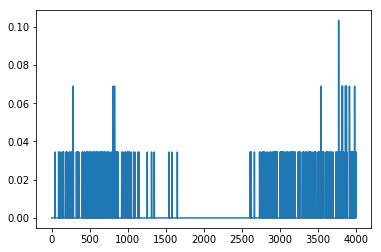

In [16]:
plt.plot(spikingProbOfTrTarget5)

## Approximate firing rate computed using a Gaussian window function with sigma=100ms
### using Spiking Probability

In [17]:
spikingProbOfTrTarget5
approxFiringRate101 = np.zeros(spikingProbOfTrTarget5.shape)
timeSeries = np.arange(spikingProbOfTrTarget5.shape[0])
sigma = 100 # 100ms
approxFiringRate101 = kernel_smoothing(spikingProbOfTrTarget5, sigma)

(4001,)


In [18]:
for timePoint in timeSeries:
    kernel = np.exp(-(timeSeries - timePoint) ** 2 / (2 * sigma ** 2))
    kernel = kernel / sum(kernel) # 正規化
    approxFiringRate101[timePoint] = sum(spikingProbOfTrTarget5 * kernel)

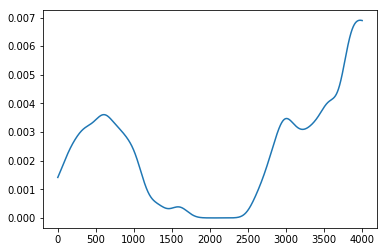

In [19]:
plt.plot(approxFiringRate101)